[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JMeneu/Baseball-Attendance-Prediction/blob/main/JPNotebook.ipynb)

# Baseball Attendance Prediction







<img width="600" style="float:left" 
     src="https://cdn.britannica.com/89/198989-050-0029E924/Clayton-Kershaw-Los-Angeles-Dodgers-2010.jpg" />








## 0. Context

_The problem consists of predicting as accurately as possible the number of people attending a sporting event (baseball games). To do so, we are provided with a database, `construction_dataset.csv`, which contains the data recorded during the first part of a season._

_+info:_

# 1. Framing the Problem

After checking the documentation provided in class, we point out the key points from a business perspective:


#### Type of ML System
* **Supervised Learning:** the training set includes the target's labels (`attend`).
* **Batch Learning:** the data provided comes in a .csv format, and date is not expected to be updated regularly. Therefore, the system has all the available data to train and learn from it.
* **Model-based:** the intended approach is to generalize from the training set, with a ML model.

#### Kind of ML Problem
* **Regression:** given that our target variable (`attend`) is an integer, we want to predict a number. 

#### Perfomance Metric
* **Mean Absolute Percentage Error:** it's a requirement in the guidelines. This metric measures the accuracy of a regression model. The following is its formula:



<img width="200" style="float:center" 
     src="https://editor.analyticsvidhya.com/uploads/61135MAPE.png" />


---

_Summary_

* **Goal**: predict `attend`.
* **Type of ML System**: Supervised Learning/ Batch Learning/ Model Based.
* **Kind of ML Problem**: Regression
* **Performance Metric**: MAPE

# 2. Obtaining the Data

Let's start off with the data. 

First of all, we have two datasets: 
* `construction_dataset.csv`
* `production_dataset.csv`

As our data is already split for us, we won't bother to split it back again. 

The done split will save us time, and will enable us to explore our `construction_dataset.csv` without having to worry about biaising our choices.

We first create a function to import our batch training and test data:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from pandas.plotting import scatter_matrix
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
import xgboost as xg
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score



TRAIN_PATH = "./datasets/construction_dataset.csv"
TEST_PATH = "./datasets/production_dataset.csv"
SUBMISSION_PATH = "./results/submission.csv"

def batch_load(path):
    return pd.read_csv(path)

train = batch_load(TRAIN_PATH)
test = batch_load(TEST_PATH)
submission = batch_load(SUBMISSION_PATH)

Our data is now imported: `train` and `test`.
Both of them are _pandas DataFrames_. 

For now, we will forget about the `test` and we will perform an Exploratory Data Analysis on the `train`.

# 3. Exploratory Data Analysis (EDA)

In this step of the Pipeline we will grasp for the first time the substance of our data: we will learn what features are present in our `train`set, check their types and how their values are distributed.

This step is fundamental to set a strategy around the next step, Data Processing.

We will start with the basics. It's always useful to use the `head()` method to see what kind of features and values to expect. 

In [2]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

train.head(5)

,Unnamed: 0,year,home_team,month,day,attend,day_of_week,opponent,temp,skies,day_night,cap,shirt,fireworks,bobblehead,hum>average,attend_inc,attend_thousands
0,0,2012,Baltimore Orioles,APR,6,32741,Friday,Minnesota Twins,59,Clear,Day,NO,NO,NO,NO,NO,NaN,33
1,1,2012,Baltimore Orioles,APR,7,22072,Saturday,Minnesota Twins,63,Clear,Night,NO,NO,NO,NO,YES,-10669.0,22
2,2,2012,Baltimore Orioles,APR,8,10317,Sunday,Minnesota Twins,68,Clear,Day,NO,NO,NO,NO,YES,-11755.0,10
3,3,2012,Baltimore Orioles,APR,9,17835,Monday,New York Yankees,65,Cloudy,Night,NO,NO,NO,NO,NO,7518.0,18
4,4,2012,Baltimore Orioles,APR,10,17261,Tuesday,New York Yankees,62,Clear,Night,NO,NO,NO,NO,NO,-574.0,17


Firstly, we see we have lots of features, where some of them are pure numerical features, and others categorical that must be One Hot Encoded in order to fit a Machine Learning Model. Our target variable, `attend`, is, again, a number.

We will have to get rid of the `Unnamed: 0` feature, as it's irrelevant to our problem, and may intefere in the performance of our final model, introducing noisy data. Same as `year`, which being always constant, again increments noise in our model.

---

_Summary_

* Numerical Features: `["day", "temp", "attend_inc", "attend_thousands"]`


* Categorical Features: `["home_team", "month", "day", "day_of_week", "opponent", "skies", "day_night", "cap", "shirt", "fireworks", "bobblehead", "hum>average"]`


* Irrelevant Features: `["Unnamed: 0", "year"]`


Now, lets have a first glance to some basic statistics of how data is distributed. 

For that, we will use the `describe()` method. 

In [3]:
train.describe()

,Unnamed: 0,year,day,attend,temp,attend_inc,attend_thousands
count,2181.000000,2181.0,2181.000000,2181.000000,2181.000000,2151.000000,2181.000000
mean,1205.994498,2012.0,15.564420,21674.905089,74.863824,-148.927476,21.669418
std,698.871560,0.0,8.720171,7014.575089,11.459913,4612.954057,7.017888
min,0.000000,2012.0,1.000000,6350.000000,6.000000,-20754.000000,6.000000
25%,601.000000,2012.0,8.000000,16119.000000,68.000000,-2050.000000,16.000000
50%,1210.000000,2012.0,15.000000,22059.000000,75.000000,13.000000,22.000000
75%,1811.000000,2012.0,23.000000,27444.000000,83.000000,1895.500000,27.000000
max,2412.000000,2012.0,31.000000,39200.000000,106.000000,25310.000000,39.000000


The method returns some basic information about our `numerical`features. To begin with, we reinforce the fact that both `["Unnamed: 0", "year"]` are irrelevant.

Secondly, we also get the total `count`of values, which indeed shows already that we have some missing values in the `attend_inc` feature.

And lastly, from the `max`and the third quartile we see no reaosn to worry about potential outliers, as in principle, they do not seem very extreme.


---

_Summary_



* Possible Outliers: None, in principle.


* Irrelevant Features: `["Unnamed: 0", "year"]`


* `NaN` Values: `["attend_inc"]`

Regarding the count of rows we have per attribute, as also the type of each, using the `info()` method comes quite handy. 

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2181 entries, 0 to 2180
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        2181 non-null   int64  
 1   year              2181 non-null   int64  
 2   home_team         2181 non-null   object 
 3   month             2181 non-null   object 
 4   day               2181 non-null   int64  
 5   attend            2181 non-null   int64  
 6   day_of_week       2181 non-null   object 
 7   opponent          2181 non-null   object 
 8   temp              2181 non-null   int64  
 9   skies             2181 non-null   object 
 10  day_night         2181 non-null   object 
 11  cap               2181 non-null   object 
 12  shirt             2181 non-null   object 
 13  fireworks         2181 non-null   object 
 14  bobblehead        2181 non-null   object 
 15  hum>average       2073 non-null   object 
 16  attend_inc        2151 non-null   float64


We have 18 features, and each of them, 2181 instances (rows). The `info()`method shows the `dtypes` of each of the columns, and as we knew, some are integers, and other (interpreted as `object`, unknown) are categorical and must be later on `OHE`.

From this method we can easily target the existance of `NaN` values, both present in `hum>average` and `attend_inc`, in major proportion in the first one. This means we will have to investigate the probable reason tp this missing values, as they could be `MCAR`, `MAR` or`MNAR`. Depending on that, we should plan a solution to fill those values, with maybe some basic statistics, ML models, or just dropping those rows. This will be further analyzed.

---

_Summary_

* 18 features.
* 2181 instances.
* Features with `NaN`values: `["hum>average", "attend_inc"]`
* Some features understood as `integers`, other as `objects`and therefore candidates for `OHE`. 

Our target is `attend`. We won't focus too much in it in this stage, but its relevant to check out how those values distributed. 

One way to easily visualize this is with a Box-Plot:

In [5]:
fig = px.box(train,x='month',y='attend', color = 'month', title="Attendance and Month", 
              points = "all", hover_data=["home_team", "opponent", "day_of_week"],width =950, height =600)
fig.show()

The difference in attendance isn't shocking. But at least we can point out the following:

* Median falls in between 18k and 24k every month

* Analyzing the upper and lower fences, in search for a pattern between home/opponent attractiveness, we see that `Los Angeles Dodgers `always appears as `home_team`top leader in Attendance, each and every month. In fact, they usually appear in the as `home_team`, which maybe is related to the players they have or the size of the stadium itself.

* If we include the day of the week into the analysis, we could think that `Monday`is the least popular day for a match, but it's not always the case.

The latter may be useful and we can even consider adding a new feature related to the size of the each stadium.

---

_Summary_

* Median between 18k and 24k
* Stadium capacity may be relevant
* Monday is sometimes the least popular day, but not always.

Okay, that's enough for raw textual information. Let's visualize our `train` dataset. 

To start off, we will use the pandas `ProfileReport()`method, which gives a good starting point to understand the distribution, correlations and other generic information of our features.


_NOTE: If you do not have the package `pandas-profiling`installed, run the following cell:_

In [6]:
!pip install -U pandas-profiling

In [7]:
profile = ProfileReport(train)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Wow, that a lots of information in one single cell! Let's analyze it! 

**General**

* Features:	18
* Rows: 2181
* Missing Values: 138

Its interesting to see how Pandas Profile is able to understand if a variable used to be categorical or not:

* Numerical: 6
* Categorical: 7
* Boolean : 5


Now, the `boolean` features must be, again, converted into 0 and 1, just like we would do for any categorical feature. 

Let's analyze each feature, one by one:


---

**Features**

_Numerical Features_

* Unnamed:0 : it's not an identifyer, even though it could work like one. Its plain noise in our model.
    + Possible Action: Drop
    
    
    
* year: year of the match, always a contant (2012).
    + Possible Action: Drop
    
    
    
* day: day of the month (1-31).
    + Distribution: not Gaussian, candidate to be Standard or MinMax Scaled.
    + Correlation: High (to be analyzed in future steps).
   
 
* temp: temperature in Farhenheit degrees.
    + Distribution: looks similar to Gaussian, but we will still scale it.
    + Correlation: High (to be analyzed in future steps)
    + Possible Actions: use other units, may be useful, as well as combining with humidity in a way.
    
 
* attend_inc: attendance increment compared to the previous match.
    + Distribution: looks similar to Gaussian, but we will still scale it.
    + Correlation: High (to be analyzed in future steps)
    + Missing Values: there seems to be 30 missing values, we will plan out an strategy to fille them in.
    + Possible Actions:  fill the missing values, maybe they can be calculated as it depends on the target variable we already know.
    + Possible Actions: drop (they depend directly on the target feature)
    
 
* attend_thousands: attendance, in a reduced format
    + Possible Actions: drop
    + Comments: they refer to the target variable, and maybe they should be dropped for being redundant. In the test set we won't have access to it.
    
 
* attend: attendance, our target feature.
    
    
As we see, we have very few `numerical`features, and some of them must be dropped. Others can be considered redundant. We will try to feed our model with new `numerical` feature that can be useful, such as the capacity of the stadium or its standing position.



<img width="600" style="float:center" 
     src="https://i.imgur.com/Nf2ZHB0.png" />
     
     

<img width="600" style="float:center" 
     src="https://i.imgur.com/PYdoJbv.png" />  
     
     
     
_NOTE: After reading through the guidelines, we have no permission to feed our model with external features. Even though these features may have been promising, they will not be included in our model._
     

---

_Categorical Features_

* home_team: the home_team of the current match.
    + Possible Actions: OHE

* Opponent: oppponent in the current match.
    + Possible Actions: OHE.
    + Comments: Similarly to `home_team`, we may find it useful if combined with the standings position.
    
    
* month: month when the event took place
    + Possible Actions: drop
    + Comments: as the test set won't include the months of the train, the information the feature gives may be irrelevant.


* day_of_week: day [Monday-Sunday] when the match takes place.
    + OHE
    + Comments: it's not very clear how relevatn the feature is. If we were talking about soccer then of course, the day would be relevant. But for baseball... maybe not. We will have a look.


* skies: status of the sky
    + Possible Actions: OHE
    + Comments: maybe the weather conditions play a significant role in the attendance.

* day_night: says whether the match is during the day or night.
    + Possible_Actions: OHE


Now, not only we will have to `OHE` lots of this categorical features, but also the ones interpreted as `boolean`:

---

_Boolean Features_

* hum>average: humidity above the average.
    + Possible Actions: OHE   
    + Comments: this feature might be interesting to combine with other weather related features.
    
    
* cap: promotional campaign
    + Possible Actions: OHE
    + Comments: this feature might be interesting to combine with other promotion related features.
    
* shirt: promotional campaign
    + Possible Actions: OHE
    + Comments: this feature might be interesting to combine with other promotion related features.    
   
* fireworks: promotional campaign
    + Possible Actions: OHE        
    + Comments: this feature might be interesting to combine with other promotion related features.    
    
* bobblehead: promotional campaign
    + Possible Actions: OHE
    + Comments: this feature might be interesting to combine with other promotion related features.    
    


Let's do some quick maths:

`Total_OHE`= 30+30+5+7+3+12 = **87**

Now, those are lots of features after OHE! Maybe too many... 


At this point we might be tempted to label-encode our features: but we must keep in mind that our model should not some of these values more relevant than others (in principle). 

Our approach will be to introduce all those features, and then cut the ones we feel are irrelevant for our final model.

If after deleting the irrelevant features they are still too many, we will plan an alternative encoding for some of our features: `target encoding`




We previously talked about the correlations. We are aware that the difference of the nature of this features, means we can't check out the correlation to our target with our `categorical`features. For now, we will take a look at the separately:

---

_Checking Correlations_

The `ProfileReport()` correlation matrix is tiny, as we have too many features to plot. 

We will create a new one, and just paying attention to the `numerical` features, to make it easier to visualize:

<AxesSubplot:>

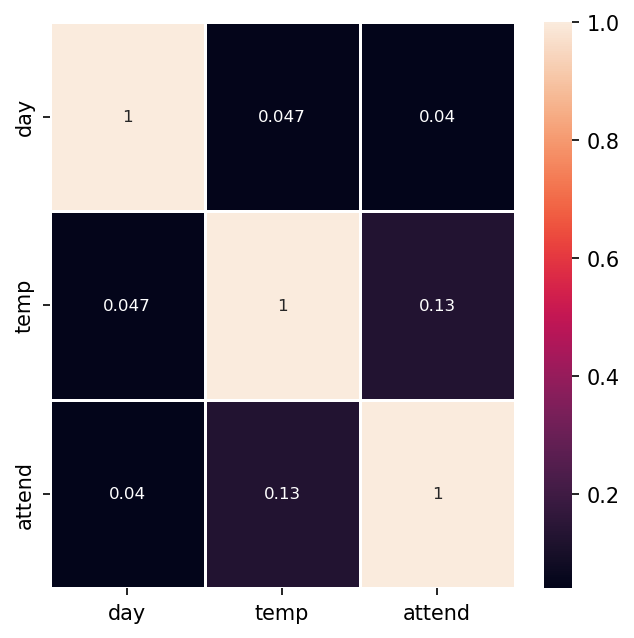

In [8]:
numerical = ["day", "temp", "attend"]

corr_matrix = train[numerical].corr()
fig, ax = plt.subplots(figsize=(5,5), dpi = 150)         
sns.heatmap(corr_matrix, annot=True, linewidths=.5, ax=ax, annot_kws={"fontsize":8})

Only `day`have a slight correlation to our target,`attend`. 

This doesn't look too promising to start off.

_Numerical_

* `day` [0.13]


Now, let's do analyze this with the `categorical`features. For that, we will use `Phik`, a correlation matrix that is able to analyze them accross numericals and categoricals, and also find out non-linear relations between the features. 


Lets have a look:

_NOTE: If you do not have the package `phik`installed, run the following cell:_

In [9]:
!pip install phik

interval columns not set, guessing: ['Unnamed: 0', 'year', 'day', 'attend', 'temp', 'attend_inc', 'attend_thousands']


/opt/anaconda3/lib/python3.9/site-packages/phik/data_quality.py:72: UserWarning:

Not enough unique value for variable year for analysis 1. Dropping this column



<AxesSubplot:>

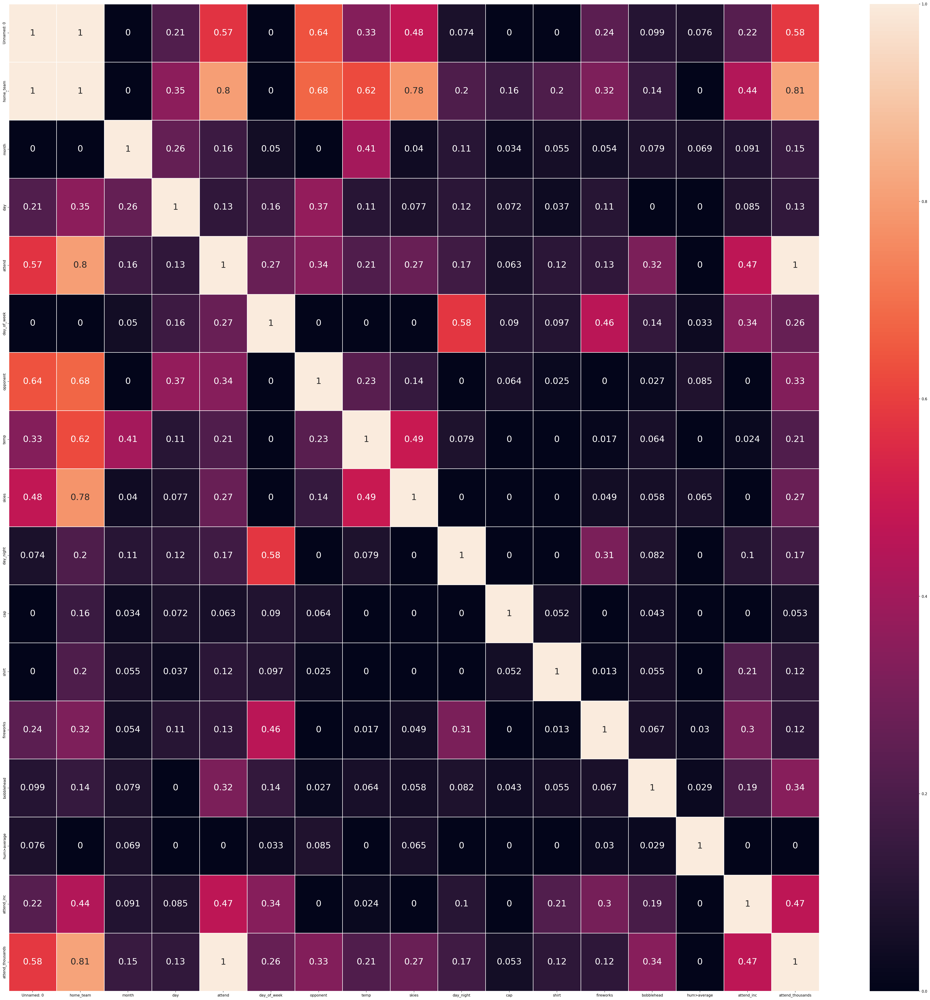

In [10]:
corr_matrix = train.phik_matrix()
fig, ax = plt.subplots(figsize=(50,50), dpi = 150)         
sns.heatmap(corr_matrix, annot=True, linewidths=.5, ax=ax,annot_kws={"fontsize":24})

Now that's a lot more informative! Even if in the end we just use this a an starting point, the matrix shows interesting insights!

Let's first analyze between the features:

* `day_of_week` and `fireworks`are highly related [0.57]
* `temp`and `skies` are highly related [0.49]
* `day_or_night` and `fireworks`are highly related [0.32]


To be fair, these combinations do not look to promising. But at least we can grasp some other do not relate to each other at all, discarding their combinations.

If we only pay attention to our target variable:

In [11]:
corr_matrix = train.phik_matrix()
corr_matrix["attend"].sort_values(ascending = False)

interval columns not set, guessing: ['Unnamed: 0', 'year', 'day', 'attend', 'temp', 'attend_inc', 'attend_thousands']


attend              1.000000
attend_thousands    0.997541
home_team           0.804175
Unnamed: 0          0.570471
attend_inc          0.467382
opponent            0.335962
bobblehead          0.315531
skies               0.267452
day_of_week         0.266011
temp                0.207994
day_night           0.170862
month               0.158866
day                 0.128286
fireworks           0.125654
shirt               0.116505
cap                 0.063097
hum>average         0.000000
Name: attend, dtype: float64

Thats insightful.

Lets go one by one:

* `home_team` seems to have a very strong relation (linear or not) to our target [0.8]. We reinforce our previous intuition.

* `opponent` seems to have a significant relation (linear or not) to our target [0.34].

* `skies` seems to have a significant relation (linear or not) to our target [0.27].

* `day_of_week` seems to have a significant relation (linear or not) to our target [0.27].

* `temp` seems to have a significant relation (linear or not) to our target [0.21].

* `day_or_night` seems to have a significant relation (linear or not) to our target [0.17].

* Some promotions, such as `fireworks`and `bobblehead` seem to ve again related to our target.

* `hum>average`shows very little - no relation at all to our target or to other features. Maybe we should drop it.


Lets have a look at an scatter matrix of our valid `numerical`features:

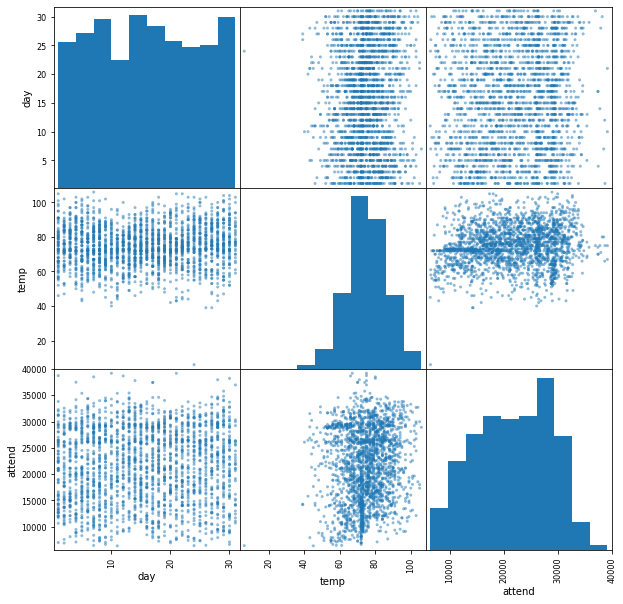

In [12]:
numerical = ["day", "temp", "attend"]
scatter_matrix(train[numerical], figsize = (10, 10));

As the matrix is symmetrical, we may pay attention to just one of the sides of the diagonal.

Attending to it, we can see that the attendance is usually higher between [60-80ºF].

Lets wrap up our main findings:



---


_Summary_

* Missing Values: `attend_inc`, `hum>average`


* Outliers: None


* OHE: `["home_team", "day", "day_of_week", "opponent", "skies", "day_night", "shirt", "fireworks", "bobblehead"]`

* Target Encoding (alternative): `["home_team", "day_of_week", "opponent", "skies"]`


* Feature Extraction: 
    + **`Numerical`**: `["Unnamed: 0", "year", "attend_inc", "attend_thousands"]`
    + **`Categorical`**: `['hum>average', 'month', 'cap']`
    
    
* Feature Generation: 
    + **`Numerical`**: `["Capacity", "Standings"]` (not permitted in the guidelines, not fed to our model)
    + **`Categorical`**: None
    
    

* Scaling: Standard or MinMax Scaling on `Numerical`

# 4. Data Processing

So, we've seen a lot in this `train` set. We saw the amount of features, how they are distributed, the irrelevancy of some, and the possible future combinations that might be useful.

Now it's time to take action, and implement the strategies we planned in the previous step!


A good starting point could have been separating both categorical and numerical features. Our strategies may change depending on the type of feature we are treating (scaling, feature generation, etc.).

Lets go on with the Data Cleaning checklist:

### _Missing Values_

We saw some missing values in our `train`set. However, a further look into those features, revealed that they were either redundant or completely irrelevant for our model. As our initial approach will be to drop them, we won't bother to fill them in. We will revisit this strategy later on, and evaluate the results.

### _Outliers_

We saw no clear outliers, nor very extreme values. Therefore, we will initially take no action regarding this.

### _Encoding_


We know there are three types of encoding aplicable over categorical features:

* Label Encoding: converting categories into numerical values, according to a specific order.
* OHE: converting each possible value of a categorical feature into a boolean feature
* Target Encoding: converting the values of each categorical feature for a value related to the target (average).

Our first approach will be to apply exclusively `OHE`. This approach is useful to feed those features to the model, but an excess in the amount of features may lead to an underperforming model.

For that reason, we will also try to apply the latter, `Target Encoding`, to limit the amount of features to the original. However, this approach may lead to overfitting heavily our set, as it performs an average between the values of the categories and the values related to the target. To reduce the impact, and as we have to forecast exclusively September/October, we will only perform this calculation around the month of September.


Let's start with `OHE`:


### _One-Hot-Encoding_

Now, in this step we must perform lots of transformations in our `categorical` features. Indeed, we must `OHE` all of them, as `label-encoding` will give weights to some classes that should differ in that regard.


Now, some of them are clearly boolean (True/False) but some others have many possible values. 

From this tarting point, we will OHE all, as we don't want our model to chatch patterns related to the order imposed in a `label-encoding`approach. However, maybe we have no choice but to do so.

Lets get our hands dirty with the pure `boolean`features:

In [13]:
def oheEncoder(train):
    categorical = ["day_night", "shirt",
                   "fireworks", "bobblehead",
                   "home_team","day_of_week",
                   "opponent", "skies"]

    names_lst = ["","promo_shirt","promo_fireworks", "promo_bobblehead", "home", "", "op", ""]

    for i, category in enumerate(categorical):
        train = pd.concat([train, pd.get_dummies(train[category]).add_prefix(names_lst[i]+"_")], axis = 1)
        train = train.drop(category, axis =1)
        
    return train

In [14]:
train = oheEncoder(train)

That was fast! Let's check how many features we got...

In [15]:
len(train.columns)

89

89 features! That's too many. We will cut them down, and keep only the ones that bring valuable information to our model.

We will also explore the possibility of using `Target Encoding` instead.



Just out of curiosity, let's try with `Target-Encoding` instead:

### _Target Encoding_

So as we predicted, `Target Encoding`leads to a heavy overfit in our dataset. We applied it focusing in the month of September, and the results were disappointing. 

We will limit ourselves to show the methods we implemented to achieve it, but certainly this encoding will not be introduced to our final model.

In [16]:
!pip install --upgrade category_encoders

In [17]:
import category_encoders as ce


def targetEncoder(train):
    '''
    Target encodes the selected features (non boolean) to obtain target encoded features, 
    for the month of September.
    
    '''
    categorical = ["home_team","day_of_week",
    "opponent", "skies"]
    tenc=ce.TargetEncoder() 
    for i, month in enumerate(train.month):
        if(month=="SEP"):
            for category in categorical:
                train = pd.concat([train, tenc.fit_transform(train[category],train['attend']).add_prefix("_")], axis = 1)
                train = train.loc[:,~train.columns.duplicated()].copy()
    return train

In [18]:
def targetEncoderTest(test):
    '''
    Applies the target encoded features from the train to the test set (as we know the test set lacks 
    the target feature)
    '''
    test["skies"].replace(dict_skies, inplace=True)
    test["home_team"].replace(dict_home, inplace=True)
    test["opponent"].replace(dict_opponent, inplace=True)
    test["day_of_week"].replace(dict_day, inplace=True)
    test["_skies"]=test["skies"]
    test["_home_team"]=test["home_team"]
    test["_opponent"]=test["opponent"]
    test["_day_of_week"]=test["day_of_week"]
    return test

In [19]:
#train = targetEncoder(train) # not implemented in the model, overfitting!

In [20]:
# dict_skies = dict(zip(train["skies"].unique(), train["_skies"].unique())) # not implemented in the model, overfitting!
# dict_home = dict(zip(train["home_team"].unique(),train["_home_team"].unique()))# not implemented in the model, overfitting!
# dict_opponent = dict(zip(train["opponent"].unique(), train["_opponent"].unique()))# not implemented in the model, overfitting!
# dict_day = dict(zip(train["day_of_week"].unique(), train["_day_of_week"].unique()))# not implemented in the model, overfitting!

So sadly, `Label Encoding` didn't help much. Even with some intensive regularization, the performance of the model got worse after it... 

We will have to work with our features, and try to squeeze the most of them!

### _Feature Generation_

In this stage, creativity and logic must work together, as we have no expertise in the field. In the past, Feature Generation was automated by creating `Polynomial Features`, but using this concept would increment too much our model's noise.

Anyways, lets go on with Feature Generation:

* `Numerical`

We saw some interesting correlations in the EDA. We also pointed to the possibility of adding new features from other sources, sucha as the stadium's `Capacity`, or the home team `standings`. 

For our first try, we won't create them. Afterwards, we will see if they worth a try.

* `Categorical` 

For the categoricals, at the present moment, maybe clustering the teams according to their similarity, can help reduce the size of the columns. 

We will generate each of them individually:

In [21]:
# Numericals

def numericalGeneration(train):
    '''
    Generates new numerical features.
    
    
    
    
    Creates new numerical features, coming from external sources or based in combination of existing features.
    '''
    #train["Capacity"]=
    #train["Standings"]=
    return train


# Categoricals

def categoricalGeneration(train):
    '''
    Generates new categorical OHE features.
    
    
    Clusters promotions into a same feature, to maximize it's relevance to predict the target.
    '''
    return train

In [22]:
train = numericalGeneration(train)
train = categoricalGeneration(train)

### _Feature Extraction_

To proceed with the Feature Extraction, it's relevant to check how our correlations to the target have changed.

We saw previously the `Phik`matrix; we will use it again to decide which features will stay, which ones will not:

In [23]:
corr_matrix = train.phik_matrix()

interval columns not set, guessing: ['Unnamed: 0', 'year', 'day', 'attend', 'temp', 'attend_inc', 'attend_thousands', '_Day', '_Night', 'promo_shirt_NO', 'promo_shirt_YES', 'promo_fireworks_NO', 'promo_fireworks_YES', 'promo_bobblehead_NO', 'promo_bobblehead_YES', 'home_Arizona Diamondbacks', 'home_Atlanta Braves', 'home_Baltimore Orioles', 'home_Boston Red Sox', 'home_Chicago Cubs', 'home_Chicago White Sox', 'home_Cincinnati Reds', 'home_Cleveland Indians', 'home_Colorado Rockies', 'home_Detroit Tigers', 'home_Houston Astros', 'home_Kansas City Royals', 'home_Los Angeles Angels', 'home_Los Angeles Dodgers', 'home_Miami Marlins', 'home_Milwaukee Brewers', 'home_Minnesota Twins', 'home_New York Mets', 'home_New York Yankees', 'home_Oakland Athletics', 'home_Philadelphia Phillies', 'home_Pittsburgh Pirates', 'home_San Diego Padres', 'home_San Francisco Giants', 'home_Seattle Mariners', 'home_St. Louis Cardinals', 'home_Tampa Bay Rays', 'home_Texas Rangers', 'home_Toronto Blue Jays', 'hom

In [24]:
corr_matrix["attend"].sort_values(ascending = False)

attend                        1.000000
attend_thousands              0.997541
home_Philadelphia Phillies    0.583165
Unnamed: 0                    0.570471
home_Los Angeles Dodgers      0.545436
home_Texas Rangers            0.493765
attend_inc                    0.467382
home_New York Yankees         0.432555
home_Boston Red Sox           0.390041
home_San Francisco Giants     0.370607
_Dome                         0.357094
home_Houston Astros           0.320509
promo_bobblehead_NO           0.315531
promo_bobblehead_YES          0.315531
home_Oakland Athletics        0.315299
home_Tampa Bay Rays           0.290637
home_Miami Marlins            0.279856
home_Chicago Cubs             0.278009
home_Cleveland Indians        0.265301
home_Minnesota Twins          0.258291
_Saturday                     0.254238
home_St. Louis Cardinals      0.251076
home_Seattle Mariners         0.242956
_Tuesday                      0.228032
home_Kansas City Royals       0.224930
home_Chicago White Sox   

Let's cut some irrelevant features to our target!

We will start with a big threshold: a 10% of Phik correlation to the target.
We may change this later, if the theshold is too aggresive.

This means we will have to get rid of the following:

In [25]:
my_dict = abs(corr_matrix["attend"]).sort_values(ascending = False)

my_dict.keys()

Index(['attend', 'attend_thousands', 'home_Philadelphia Phillies',
       'Unnamed: 0', 'home_Los Angeles Dodgers', 'home_Texas Rangers',
       'attend_inc', 'home_New York Yankees', 'home_Boston Red Sox',
       'home_San Francisco Giants', '_Dome', 'home_Houston Astros',
       'promo_bobblehead_NO', 'promo_bobblehead_YES', 'home_Oakland Athletics',
       'home_Tampa Bay Rays', 'home_Miami Marlins', 'home_Chicago Cubs',
       'home_Cleveland Indians', 'home_Minnesota Twins', '_Saturday',
       'home_St. Louis Cardinals', 'home_Seattle Mariners', '_Tuesday',
       'home_Kansas City Royals', 'home_Chicago White Sox',
       'op_Chicago White Sox', 'home_Los Angeles Angels', 'temp',
       'home_Detroit Tigers', 'home_New York Mets', '_Cloudy',
       'home_Colorado Rockies', 'home_San Diego Padres', '_Night', '_Day',
       '_Friday', 'home_Milwaukee Brewers', '_Wednesday', 'month',
       'home_Arizona Diamondbacks', '_Sunday', '_Monday',
       'op_Los Angeles Angels', 'home_Bal

In this field there is definitely room for improvement. We have too many irrelevant features:

* Numerical

For the `numerical ` features, we must get rid of several irrelevant features: 
`["year", "attend_thousands",
"attend_inc","Unnamed: 0"]`


* Categorical

As we saw before, a closer look to these categorical features reveals that an important amount of `opponents`are not relevant at all. By setting a threshold of a 5% of correlation with the target we get rid of the following:

`['month',
'op_Kansas City Royals', 'op_Baltimore Orioles', 'op_Houston Astros',
'op_Arizona Diamondbacks', 'op_New York Yankees',
'op_Pittsburgh Pirates', 'op_St. Louis Cardinals', 'op_New York Mets',
'cap', 'op_Atlanta Braves', 'home_Cincinnati Reds',
'op_Cincinnati Reds', 'op_Philadelphia Phillies', 'op_Detroit Tigers',
'op_Chicago Cubs', 'home_Atlanta Braves', 'op_Minnesota Twins',
'op_Texas Rangers', 'op_Tampa Bay Rays', 'op_Cleveland Indians',
'op_Washington Nationals', 'hum>average', 'op_San Diego Padres',
'op_Oakland Athletics', 'op_Milwaukee Brewers', 'op_Miami Marlins',
'op_Colorado Rockies', '_Rainy']`


If this approach is too aggresive, we will downgrade the threshold, and with trial and error, will determine which approach is better.

To get rid of those features, we will use the `drop()`pandas method:

In [26]:
def categoricalExtraction(train):
    
    '''
    Gets rid of the irrelevant features, according to correlations.
    '''
    categorical_drop = ['month',                     
       'op_Kansas City Royals', 'op_Baltimore Orioles', 'op_Houston Astros',
       'op_Arizona Diamondbacks', 'op_New York Yankees',
       'op_Pittsburgh Pirates', 'op_St. Louis Cardinals', 'op_New York Mets',
       'cap', 'op_Atlanta Braves', 'home_Cincinnati Reds',
       'op_Cincinnati Reds', 'op_Philadelphia Phillies', 'op_Detroit Tigers',
       'op_Chicago Cubs', 'home_Atlanta Braves', 'op_Minnesota Twins',
       'op_Texas Rangers', 'op_Tampa Bay Rays', 'op_Cleveland Indians',
       'op_Washington Nationals', 'hum>average', 'op_San Diego Padres',
       'op_Oakland Athletics', 'op_Milwaukee Brewers', 'op_Miami Marlins',
       'op_Colorado Rockies', '_Rainy']
    return train.drop(categorical_drop, axis =1)


def numericalExtraction(train):
    '''
    Gets rid of irrelevant numerical features.
    '''
    numerical_drop = ["year", "attend_thousands",
                     "attend_inc","Unnamed: 0"]

    return train.drop(numerical_drop, axis =1)

In [27]:
train = categoricalExtraction(train)

In [28]:
train = numericalExtraction(train)

After perfoming the drop and generation of the features, it's interesting to see how the remaining features are correlated with the target. Reusing the `corr()`method:

In [29]:
corr_matrix = train.corr()
corr_matrix["attend"].sort_values(ascending = False)

attend                        1.000000
home_Philadelphia Phillies    0.244247
home_New York Yankees         0.238779
home_Texas Rangers            0.212490
home_San Francisco Giants     0.199762
_Saturday                     0.196759
home_Los Angeles Dodgers      0.193910
home_St. Louis Cardinals      0.174481
temp                          0.127385
home_Los Angeles Angels       0.125938
home_Detroit Tigers           0.123703
home_Boston Red Sox           0.122878
_Cloudy                       0.115956
_Friday                       0.108393
_Day                          0.105984
promo_bobblehead_YES          0.102363
promo_fireworks_YES           0.099747
home_Chicago Cubs             0.094093
_Sunday                       0.088445
_Clear                        0.080388
home_Milwaukee Brewers        0.072316
home_Minnesota Twins          0.064094
day                           0.039551
home_Colorado Rockies         0.033361
op_San Francisco Giants       0.032569
op_Los Angeles Dodgers   

It seems like we have created relevant features, and dropped irrelevant ones! Now, of course there are still others that remain irrelevant. 

Now, lets move on to scaling:

### _Scaling_

Scaling is a fundamental step in every Machine Learning pipeline. Even if your final model doesn't need it, some other require it. Plus, it doesn't make sense to have features ranging values from `[0-90]`, like the case of `Slope`, and other ranging from `[0-6993]`, the case of `Vertical_Distance_To_Fire_Points`.


We may apply any of the 4 scalers studied in class. We will try both the traditional `StandardScaler()` , which standarizes our features by removing the mean and scaling to unit variance, and the `MinMaxScaler()`, just to see if there is any difference in our end model.

We will only apply this over numerical features. One usual practice is creating a `Column Transformer`, but as our data is not noisy, we won't make use of it.

In [30]:
categorical = ['hum>average', '_Day', '_Night',
       'promo_cap_NO', 'promo_cap_YES', 'promo_shirt_NO', 'promo_shirt_YES',
       'promo_fireworks_NO', 'promo_fireworks_YES', 'promo_bobblehead_NO',
       'promo_bobblehead_YES', 'home_Arizona Diamondbacks',
       'home_Atlanta Braves', 'home_Baltimore Orioles', 'home_Boston Red Sox',
       'home_Chicago Cubs', 'home_Chicago White Sox', 'home_Cincinnati Reds',
       'home_Cleveland Indians', 'home_Colorado Rockies',
       'home_Detroit Tigers', 'home_Houston Astros', 'home_Kansas City Royals',
       'home_Los Angeles Angels', 'home_Los Angeles Dodgers',
       'home_Miami Marlins', 'home_Milwaukee Brewers', 'home_Minnesota Twins',
       'home_New York Mets', 'home_New York Yankees', 'home_Oakland Athletics',
       'home_Philadelphia Phillies', 'home_Pittsburgh Pirates',
       'home_San Diego Padres', 'home_San Francisco Giants',
       'home_Seattle Mariners', 'home_St. Louis Cardinals',
       'home_Tampa Bay Rays', 'home_Texas Rangers', 'home_Toronto Blue Jays',
       'home_Washington Nationals', '_Friday', '_Monday', '_Saturday',
       '_Sunday', '_Thursday', '_Tuesday', '_Wednesday',
       'op_Arizona Diamondbacks', 'op_Atlanta Braves', 'op_Baltimore Orioles',
       'op_Boston Red Sox', 'op_Chicago Cubs', 'op_Chicago White Sox',
       'op_Cincinnati Reds', 'op_Cleveland Indians', 'op_Colorado Rockies',
       'op_Detroit Tigers', 'op_Houston Astros', 'op_Kansas City Royals',
       'op_Los Angeles Angels', 'op_Los Angeles Dodgers', 'op_Miami Marlins',
       'op_Milwaukee Brewers', 'op_Minnesota Twins', 'op_New York Mets',
       'op_New York Yankees', 'op_Oakland Athletics',
       'op_Philadelphia Phillies', 'op_Pittsburgh Pirates',
       'op_San Diego Padres', 'op_San Francisco Giants', 'op_Seattle Mariners',
       'op_St. Louis Cardinals', 'op_Tampa Bay Rays', 'op_Texas Rangers',
       'op_Toronto Blue Jays', 'op_Washington Nationals', '_Clear', '_Cloudy',
       '_Dome', '_Rainy']

numerical = ['temp', 'day']

In [31]:
def numericalScaler(train, numerical):
    '''
    Scales the numerical features, with an StandardScaler()/MinMaxScaler()
    '''
    scaler = MinMaxScaler()
    train[numerical] = scaler.fit_transform(train[numerical])
    return train

In [32]:
train = numericalScaler(train, numerical) 

In [33]:
train

,day,attend,temp,_Day,_Night,promo_shirt_NO,promo_shirt_YES,promo_fireworks_NO,promo_fireworks_YES,promo_bobblehead_NO,promo_bobblehead_YES,home_Arizona Diamondbacks,home_Baltimore Orioles,home_Boston Red Sox,home_Chicago Cubs,home_Chicago White Sox,home_Cleveland Indians,home_Colorado Rockies,home_Detroit Tigers,home_Houston Astros,home_Kansas City Royals,home_Los Angeles Angels,home_Los Angeles Dodgers,home_Miami Marlins,home_Milwaukee Brewers,home_Minnesota Twins,home_New York Mets,home_New York Yankees,home_Oakland Athletics,home_Philadelphia Phillies,home_Pittsburgh Pirates,home_San Diego Padres,home_San Francisco Giants,home_Seattle Mariners,home_St. Louis Cardinals,home_Tampa Bay Rays,home_Texas Rangers,home_Toronto Blue Jays,home_Washington Nationals,_Friday,_Monday,_Saturday,_Sunday,_Thursday,_Tuesday,_Wednesday,op_Boston Red Sox,op_Chicago White Sox,op_Los Angeles Angels,op_Los Angeles Dodgers,op_San Francisco Giants,op_Seattle Mariners,op_Toronto Blue Jays,_Clear,_Cloudy,_Dome
0,0.166667,32741,0.53,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0.200000,22072,0.57,0,1,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0.233333,10317,0.62,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0.266667,17835,0.59,0,1,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0.300000,17261,0.56,0,1,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2176,0.166667,15713,0.73,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
2177,0.200000,19973,0.77,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2178,0.233333,20202,0.77,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2179,0.266667,17077,0.68,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


Now our features are correctly scaled!

This is a good starting point for the Data Processing stage. We will return to it in case its necessary.

# 5. Modelling

After the Importing, exploring and cleaning our `train` set, it's time to set a first benchmark model. The only intention of this model is to ground up some base from which we can contruct and improve our model. 

As we mentioned, the problem is a Regression problem. Therefore, the most basic starting point is the `Linear Regression`model.

This model is one of the simplest classification models we can implement, but has some advantages:
* Easy to implement


However, this simple model, as it usually happens with too simple models, often turn into Underfitting models. To create more ellaborated and complex models, we might be interested in evaluating others such as:

* `Super Vector Machines (Super Vector Regressor)`
* `XGBoost`
* `Decision Trees`
* `Random Forest and Variations`

For each of them, we will measure it's performance, with the selected metric, and always attending to a cross-validation fold approach. This is fundamental to have a more realistic score from the training phase.

_NOTE: As it was seen earlier on in the second stage of the pipeline, the data is already split for us in `train`and `test`. Therefore, no split is necessary, as we will perform cross-validation and not fixed-validation later on._

In [34]:
SEED = 69 # we set our seed to make our results reproducible

X = train.drop(["attend"], axis = 1)
y = train["attend"]

### _Linear Regression_

Linear Regression is based on computing a weighted sum of input features, plus a final bias term. It's the `"Hello world!"`of Regression models in Machine Learning.


We will use a variation from the traditional `Linear Regression`: `LinearRegressionCV` . With it, we will be able to apply Cross-Validation to our model. 

Cross Validation creates virtual splits on our `train`set during runtime, as many as we set. Then, it uses, in each iteration, each of the folds as fixed validation sets. Finally, it returns back an averaged result, giving a more refined and realistic result.

We could also apply regularization to our model, but it may not be even necessary, as we do not expect it to overfit our set (it's a simple model).


Let's create our first model!

In [35]:
linear = LinearRegression()
linear.fit(X, y)

LinearRegression()

In [36]:
from sklearn.metrics import mean_absolute_percentage_error
pred = linear.predict(X)
print(-cross_val_score(linear, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

915014500129.0667


Okay, now our model is trained. 

This is a decent starting point.

Let's try other more advanced models:


### _Super Vector Machines_

`SVM`are powerful and all-rounded, as they are suitable for multiple ML systems. 

In [37]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_percentage_error
svr = SVR(kernel="linear", C=1000, gamma="auto")
svr.fit(X, y)

SVR(C=1000, gamma='auto', kernel='linear')

In [38]:
from sklearn.metrics import mean_absolute_percentage_error
pred = svr.predict(X)
print(-cross_val_score(svr, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

0.3186878173515795


The scores are similar, but in SVR we will be able to tune up more our model. We will try other ones, and come back in case the performance of this model is promising in comparison.


After trying out different models, we see that selecting the kernel as `linear`and the C as `1000`is optimal. This may seem counterituitive, as we are reducing the regularization parameter, but incrementing the penalization results in a narrow range of values, that ends up underfitting.



### _XGBoost_

Lets try another advanced model: XGBoost.

With XGBoost we predict the label by evaluating a tree of if-then-else true/false questions.

Afterwards, we estimate the minimum number of questions needed to assess the probability of making a correct decision.

In [39]:
xgb = xg.XGBRegressor(objective ='reg:squarederror', n_estimators = 1000, 
                      booster = 'gbtree',eta = 0.01, max_depth =10, seed = SEED)
xgb.fit(X, y)
print(-cross_val_score(xgb, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

0.31017859855780366


This results do not improve much of what we already had. We will discard it as a simple `Linear Regression` shows better results.

### _Decision Trees_

After trying SVM models lets jump to a new model: `Decision Trees`


Now, this is a very different model from `Linear Regression`. Of course, this model is much more advanced than the previous, which means we should pay attention to overfitting. This model is also the core of another model we will try later, `Random Forest`. 

As it name indicates, its based on creating decision trees, with variable depth, to drill down the possible outputs attending to different features.

In [40]:
tree = DecisionTreeRegressor(max_depth = 100, min_samples_split = 8)
tree.fit(X, y)

DecisionTreeRegressor(max_depth=100, min_samples_split=8)

In [41]:
from sklearn.metrics import mean_absolute_percentage_error
pred = tree.predict(X)
print(-cross_val_score(tree, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

0.33033579966517845


We can also visualize how the Tree looks like:

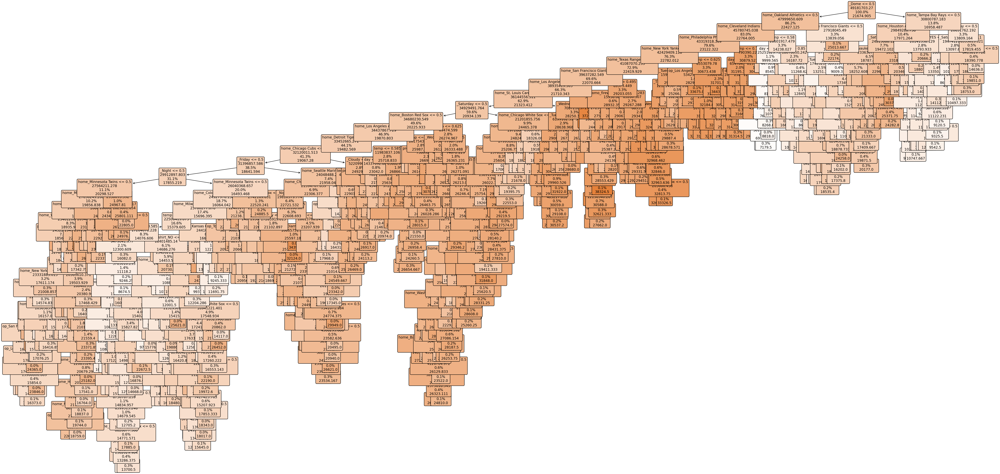

In [42]:
temp_lst = list(train["attend"].unique())

plt.figure(figsize=(50,25), dpi=200)
plot_tree(tree, fontsize = 10, rounded=True, proportion=True, label=None,
          feature_names=X.columns,
          class_names=str(temp_lst),
          filled=True);

## _Random Forest_

Random Forest works similarly to `Decision Trees`, as they share the same core functionality. The main difference to Decision Trees is that it is part of the Ensemble Methods Family. 

`Ensemble` methods offer the possibility to combine multiple models into one. There are three main types of ways to combine those models, and Random Forest uses essentially `Bagging`. We won't, at this moment, try to merge models into one, as first we must come out with a fine tuned and well perfomed model.


So, in this step we will try the `Random Forest` model. This model is based on the combination of multiple random Decision Trees, on subsamples of our `train`set. 

Another difference with Decision Trees is that, as it uses random subsets of the `train` set, it also chooses randomly the features involved in the creation of nodes. 

Enough theory, lets move on to the practice!



In [43]:
rf = RandomForestRegressor(n_estimators=1000, random_state=SEED)
rf.fit(X, y)

RandomForestRegressor(n_estimators=1000, random_state=69)

In [44]:
from sklearn.metrics import mean_absolute_percentage_error
pred = rf.predict(X)
print(-cross_val_score(rf, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

0.30207101519825297


Now that score seems like a good improvement from our previous model. However, and similarly to `SVM`with high penalizations, the results are set in a too narrow range, leading to underfitting. 

We will first try, just in case, a small variation from Random Forest: `Extra Trees`.

## _Extra Trees_ 

In `Extra Trees`, our threshold will also be chosen randomly, as were those features to decide the splits.

This model is fast to train, so we will give it a try, just in case:

In [45]:
et = ExtraTreesRegressor(n_estimators = 10, 
                          max_features = 'log2', 
                          random_state = SEED)
et.fit(X, y)

ExtraTreesRegressor(max_features='log2', n_estimators=10, random_state=69)

In [46]:
from sklearn.metrics import mean_absolute_percentage_error
pred = et.predict(X)
print(-cross_val_score(et, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

0.3165039222843505


The results seem to be promising. We will try to optimize the Hyperparameter of the model by using the previously mentioned `RandomizedGridSearchCV`. 

This Grid Search is much faster than the standard `GridSearchCV`, but it requires a bit of trial and error to drill down the best thresholds in which the search should be done.

Lets run it:


In [47]:
et = ExtraTreesRegressor(n_estimators = 1000,
                          max_features = 'log2', 
                          n_jobs = -1,
                          random_state = SEED)
et.fit(X, y)
print(-cross_val_score(et, X, y, scoring = 'neg_mean_absolute_percentage_error', cv=5).mean())

0.3134643723418035


The score improved slightly! But still doesn't perform as good as previous models...


We will check the `Feature Importance` of our model, just out of curiosity:

### Feature Importance

At this point, and as we are using a model based on `Random Forest`, we can check the relevancy of the features that compose our model. This feature importance is measured with the average reduced impurity in each node, that uses an specific feature. 

From this table we can see the 5 most important features used for our final model: 

In [48]:
et_feature_importances = pd.DataFrame(et.feature_importances_, index=X.columns,
                                      columns=['Importance']).sort_values('Importance', ascending=False)

et_feature_importances.head(5)

,Importance
day,0.079285
temp,0.075009
home_Philadelphia Phillies,0.055467
home_New York Yankees,0.052262
home_Texas Rangers,0.040161


# 7. Deploying our Predictions

Confusing enough, `Linear Regression` out-performed several advanced models. However, it seems the developed `SVM Regressor`outperforms it by a tiny bit. This will be our final model.

We should now apply the same transformations we have applied previously, to then obtain our final submission!

Let's see how it goes!

In [49]:
# test = targetEncoderTest(test) # not implemented in our final model
test = oheEncoder(test)
test = numericalGeneration(test)
test = categoricalGeneration(test) 
test = numericalExtraction(test)
test = categoricalExtraction(test)
test = numericalScaler(test, numerical) 

In [50]:
pred = svr.predict(test.drop(columns=["attend"], axis = 1))

In [51]:
submission = pd.DataFrame(data = pred, columns = ["attend"])
submission["attend"] = pred
submission.to_csv(SUBMISSION_PATH, index = False)

As a reference, let's see how our predictions look in a `boxplot`:

In [52]:
fig = px.box(submission,y='attend', title="Predicted Attendance - SVM Regressor", 
              points = "all",width =400, height =1000)
fig.show()

# References

* Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition

